In [1]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pickle
# Set random seed
np.random.seed(30)
# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Train Random Forest model
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print(train_r2)
print("R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


RDKit WARNING: [06:58:02] Enabling RDKit 2019.09.1 jupyter extensions


0.9538508364815751
R^2 score:  0.6973734965180022
Train RMSE: 0.3204485804085303
Test RMSE: 0.7752657939850667


In [2]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Create a Random Forest model
model = RandomForestRegressor(random_state=42)

# Create the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Save the best parameters
with open('best_params.pkl', 'wb') as f:
    pickle.dump(best_params, f)

# Load the best parameters
with open('best_params.pkl', 'rb') as f:
    best_params = pickle.load(f)

# Train Random Forest model with the best parameters
best_model = RandomForestRegressor(**best_params, random_state=42)
best_model.fit(X_train, y_train)

# Predict
train_predictions = best_model.predict(X_train)
predictions = best_model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, train_predictions))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))
print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Fitting 3 folds for each of 288 candidates, totalling 864 fits
Train R^2 score:  0.9556510043502141
Test R^2 score:  0.6974686262047377
Train RMSE: 0.31413644867579915
Test RMSE: 0.7751439332292946


In [26]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import xgboost as xgb
import pickle

# Set random seed
np.random.seed(30)

# Read Excel file
df = pd.read_excel('LCK_ac.xlsx')

# Convert SMILES strings to molecule objects
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# Create new column to save Atom Pair fingerprints
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Define parameter grid
params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.5, 0.7, 1],
    'colsample_bytree': [0.5, 0.7, 1],
    'alpha': [0, 0.1, 1, 10],
    'lambda': [0, 0.1, 1, 10],
    'tree_method': ['gpu_hist']  # Use GPU
}

# Initialize XGBoost Regressor
model = xgb.XGBRegressor()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(model, params, n_iter=1000, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit model
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print("Best parameters: ", best_params)

# Save the best parameters
with open('best_params_xgb.pkl', 'wb') as f:
    pickle.dump(best_params, f)

# Load the best parameters and re-train the model
with open('best_params_xgb.pkl', 'rb') as f:
    best_params = pickle.load(f)

# Train model with best parameters
model = xgb.XGBRegressor(**best_params)
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Best parameters:  {'tree_method': 'gpu_hist', 'subsample': 1, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.01, 'lambda': 0.1, 'colsample_bytree': 0.5, 'alpha': 0}
Train R^2 score:  0.9866897313522297
Test R^2 score:  0.7143955889015199
Train RMSE: 0.17209563130209304
Test RMSE: 0.7531467353892787


In [5]:
###SVM
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.svm import SVR
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Define parameter grid
# params = {
#     'C': [0.1, 1, 10, 100], 
#     'gamma': [1, 0.1, 0.01, 0.001],
#     'kernel': ['linear', 'rbf', 'poly']
# }

# Initialize SVR
# model = SVR()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_svr.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_svr.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
# model = SVR(**best_params)
model = SVR()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.8046195216037524
Test R^2 score:  0.6310449129174451
Train RMSE: 0.6593515318840664
Test RMSE: 0.8560199650708674


In [6]:
###DT
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.tree import DecisionTreeRegressor
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Define parameter grid
# params = {
#     'criterion': ['mse', 'friedman_mse', 'mae'], 
#     'splitter': ['best', 'random'],
#     'max_depth': [None, 5, 10, 15, 20],
#     'min_samples_split': [2, 5, 10],
# }

# Initialize DecisionTreeRegressor
# model = DecisionTreeRegressor()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_dtr.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_dtr.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = DecisionTreeRegressor()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.998535301553429
Test R^2 score:  0.3274119731953252
Train RMSE: 0.05708875154663211
Test RMSE: 1.155770774644051


In [7]:
###KNN
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

#Define parameter grid
params = {
    'n_neighbors': [3, 5, 7, 9, 11], 
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
}

#Initialize KNeighborsRegressor
model = KNeighborsRegressor()

# Initialize GridSearchCV
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

#Fit model
grid.fit(X_train, y_train)

# Get the best parameters
best_params = grid.best_params_
print("Best parameters: ", best_params)

# Save the best parameters
with open('best_params_knn.pkl', 'wb') as f:
    pickle.dump(best_params, f)

# Load the best parameters and re-train the model
with open('best_params_knn.pkl', 'rb') as f:
    best_params = pickle.load(f)

# Train model with best parameters
model = KNeighborsRegressor(**best_params)
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Best parameters:  {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}
Train R^2 score:  0.998535301553429
Test R^2 score:  0.6944874214114982
Train RMSE: 0.05708875154663211
Test RMSE: 0.7789537823236234


In [8]:
###LightGBM
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import lightgbm as lgb
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Define parameter grid
params = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]
    }

# Initialize LightGBM
model = lgb.LGBMRegressor()

# Initialize GridSearchCV
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit model
grid.fit(X_train, y_train)

# Get the best parameters
best_params = grid.best_params_
print("Best parameters: ", best_params)

# Save the best parameters
with open('best_params_lgbm.pkl', 'wb') as f:
    pickle.dump(best_params, f)

# Load the best parameters and re-train the model
with open('best_params_lgbm.pkl', 'rb') as f:
    best_params = pickle.load(f)

#Train model with best parameters
model = lgb.LGBMRegressor(**best_params)
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
Best parameters:  {'lambda_l1': 0, 'lambda_l2': 0, 'min_data_in_leaf': 30, 'num_leaves': 31, 'reg_alpha': 0.1}
Train R^2 score:  0.9564475769790082
Test R^2 score:  0.6784468113048977
Train RMSE: 0.31130249117625275
Test RMSE: 0.7991412578394903


In [3]:
###AdaBoost
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import AdaBoostRegressor
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# # Define parameter grid
# params = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate' : [0.01,0.05,0.1,0.3,1],
#     'loss' : ['linear', 'square', 'exponential']
#     }

# # Initialize AdaBoost
# model = AdaBoostRegressor()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_adaboost.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_adaboost.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = AdaBoostRegressor()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.5363116559713159
Test R^2 score:  0.4860496743126169
Train RMSE: 1.0157563001340009
Test RMSE: 1.0103171272449019


In [4]:
###GradientBoosting
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import AdaBoostRegressor
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# # Define parameter grid
# params = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate' : [0.01,0.05,0.1,0.3,1],
#     'loss' : ['linear', 'square', 'exponential']
#     }

# # Initialize AdaBoost
# model = AdaBoostRegressor()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_adaboost.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_adaboost.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = AdaBoostRegressor()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.5363116559713159
Test R^2 score:  0.4860496743126169
Train RMSE: 1.0157563001340009
Test RMSE: 1.0103171272449019


In [5]:
###Lasso
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import Lasso
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# # Define parameter grid
# params = {
#     'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
#     'max_iter': [1000, 2000, 3000]
# }

# # Initialize Lasso
# model = Lasso()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_lasso.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_lasso.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = Lasso()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.0
Test R^2 score:  -0.0065102419296434455
Train RMSE: 1.491682638987266
Test RMSE: 1.4138594593398917


In [6]:
###Ridge
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import Ridge
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# # Define parameter grid
# params = {
#     'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
#     'max_iter': [1000, 2000, 3000]
# }

# # Initialize Ridge
# model = Ridge()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_ridge.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_ridge.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = Ridge()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.9728316361800449
Test R^2 score:  0.04066038748295886
Train RMSE: 0.24587149243324388
Test RMSE: 1.3803312849593592


In [7]:
###ElasticNet
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import ElasticNet
import numpy as np
import pickle

# Set random seed
np.random.seed(30)

# 读取Excel文件
df = pd.read_excel('LCK_ac.xlsx')

# 将SMILES字符串转换为分子对象
ms = [Chem.MolFromSmiles(x) for x in df['smiles']]

# 创建新列来保存Atom Pair指纹
df['AP_FP'] = [AllChem.GetHashedAtomPairFingerprintAsBitVect(x) for x in ms]

with open('ap_fingerprints.pkl', 'wb') as f:
    pickle.dump(df['AP_FP'].values, f)

# Save labels
with open('labels.pkl', 'wb') as f:
    pickle.dump(df['pIC50'].values, f)

with open('ap_fingerprints.pkl', 'rb') as f:
    ap_fingerprints = pickle.load(f)

# Load labels
with open('labels.pkl', 'rb') as f:
    labels = pickle.load(f)

ap_fingerprints = np.array(list(ap_fingerprints))

# Split to separate out the training and test set
X_train, X_test, y_train, y_test = train_test_split(ap_fingerprints, labels, test_size=0.1, random_state=42)

# Define parameter grid
params = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
    'l1_ratio': np.linspace(0, 1, 10),
    'max_iter': [1000, 2000, 3000]
}

# Initialize ElasticNet
model = ElasticNet()

# # Initialize GridSearchCV
# grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)

# # Fit model
# grid.fit(X_train, y_train)

# # Get the best parameters
# best_params = grid.best_params_
# print("Best parameters: ", best_params)

# # Save the best parameters
# with open('best_params_elasticnet.pkl', 'wb') as f:
#     pickle.dump(best_params, f)

# # Load the best parameters and re-train the model
# with open('best_params_elasticnet.pkl', 'rb') as f:
#     best_params = pickle.load(f)

# Train model with best parameters
model = ElasticNet()
model.fit(X_train, y_train)

# Predict
train_predictions = model.predict(X_train)
predictions = model.predict(X_test)

# Calculate and print R^2 score
train_r2= r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, predictions)
print("Train R^2 score: ", train_r2)
print("Test R^2 score: ", test_r2)

# Calculate and print RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, model.predict(X_train)))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions))

print(f"Train RMSE: {rmse_train}")
print(f"Test RMSE: {rmse_test}")


Train R^2 score:  0.0
Test R^2 score:  -0.0065102419296434455
Train RMSE: 1.491682638987266
Test RMSE: 1.4138594593398917


In [27]:
from sklearn.ensemble import VotingRegressor
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pickle






# Define the individual models with their optimized parameters
rf_model = RandomForestRegressor()
xgb_model = xgb.XGBRegressor(
    tree_method='gpu_hist', 
    subsample=1, 
    n_estimators=500, 
    min_child_weight=5, 
    max_depth=10, 
    learning_rate=0.01, 
    reg_lambda=0.1, 
    colsample_bytree=0.5, 
    reg_alpha=0
)
knn_model = KNeighborsRegressor(
    metric='manhattan', 
    n_neighbors=5, 
    weights='distance'
)
lgbm_model = lgb.LGBMRegressor()
# Combine the models into a single ensemble model
ensemble_model = VotingRegressor(estimators=[
    ('rf', rf_model),
    ('xgb', xgb_model),
    ('knn', knn_model),
    ('lgbm', lgbm_model)
])

# Fit the ensemble model to the training data
ensemble_model.fit(X_train, y_train)

# Predict using the ensemble model
ensemble_train_predictions = ensemble_model.predict(X_train)
ensemble_predictions = ensemble_model.predict(X_test)

# Calculate and print R^2 score
ensemble_train_r2 = r2_score(y_train, ensemble_train_predictions)
ensemble_test_r2 = r2_score(y_test, ensemble_predictions)
print("Train R^2 score: ", ensemble_train_r2)
print("Test R^2 score: ", ensemble_test_r2)

# Calculate and print RMSE
ensemble_rmse_train = np.sqrt(mean_squared_error(y_train, ensemble_train_predictions))
ensemble_rmse_test = np.sqrt(mean_squared_error(y_test, ensemble_predictions))
print(f"Train RMSE: {ensemble_rmse_train}")
print(f"Test RMSE: {ensemble_rmse_test}")


Train R^2 score:  0.9842842596673941
Test R^2 score:  0.7217544477584663
Train RMSE: 0.18700096920023995
Test RMSE: 0.7433806596737025


In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

# 使用 seaborn 默认的主题
sns.set_theme()

# 创建一个新的图表，设置分辨率为 300 dpi
fig = plt.figure(figsize=(10, 10), dpi=1200)

# 创建网格
gs = GridSpec(4,4)

# 创建子图
ax_joint = fig.add_subplot(gs[1:4,0:3])
ax_marg_x = fig.add_subplot(gs[0,0:3])
ax_marg_y = fig.add_subplot(gs[1:4,3])

# 绘制散点图和直方图
ax_joint.scatter(y_train,  ensemble_train_predictions, color='blue', s=20, alpha=0.5, label='Train')
ax_joint.scatter(y_test, ensemble_predictions, color='red', s=20, alpha=0.5, label='Test')

# 添加直方图和 KDE 曲线
sns.distplot(y_train, color='blue', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2, "label": "KDE"})
sns.distplot(y_test, color='red', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

sns.distplot(ensemble_train_predictions, color='blue', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2})
sns.distplot(ensemble_predictions, color='red', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

# 去掉直方图的背景和坐标
ax_marg_x.axis('off')
ax_marg_y.axis('off')

# 添加一条对角线，代表完美预测
ax_joint.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         color='gray', linestyle='--')

# 增加网格线
ax_joint.grid(True, linestyle='--', alpha=0.6)

# 添加图例
ax_joint.legend()

# 添加轴标签
ax_joint.set_xlabel('True Values', fontsize=14)
ax_joint.set_ylabel('Predictions', fontsize=14)

# 设置标题
#ax_joint.set_title('Stacking Model Predictions vs True Values', fontsize=16)

# 设置边界和间距
plt.tight_layout()

# 显示图表
plt.show()


/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packa

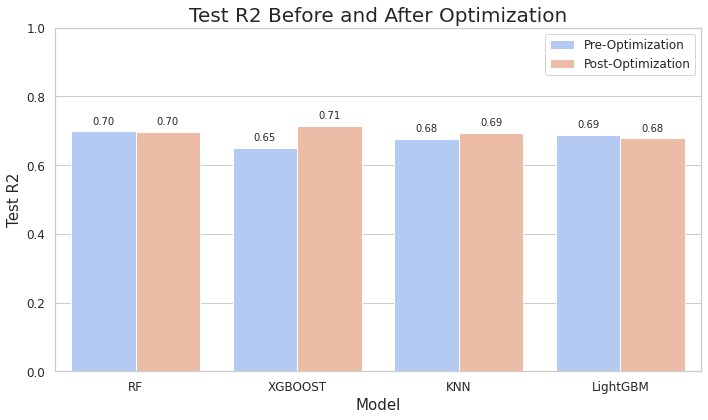

In [70]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 创建数据
data = {
    'Model': ['RF', 'XGBOOST', 'KNN', 'LightGBM', 'RF', 'XGBOOST', 'KNN', 'LightGBM',
              'RF', 'XGBOOST', 'KNN', 'LightGBM', 'RF', 'XGBOOST', 'KNN', 'LightGBM'],
    'Metric': ['Test R2', 'Test R2', 'Test R2', 'Test R2', 'Test R2', 'Test R2', 'Test R2', 'Test R2',
               'Test RMSE', 'Test RMSE', 'Test RMSE', 'Test RMSE', 'Test RMSE', 'Test RMSE', 'Test RMSE', 'Test RMSE'],
    'Value': [0.699, 0.65, 0.677, 0.689, 0.697, 0.714, 0.694, 0.678, 0.773, 0.834, 0.801, 0.786, 0.775, 0.753, 0.779, 0.799],
    'Optimization': ['Pre-Optimization', 'Pre-Optimization', 'Pre-Optimization', 'Pre-Optimization', 
                     'Post-Optimization', 'Post-Optimization', 'Post-Optimization', 'Post-Optimization',
                     'Pre-Optimization', 'Pre-Optimization', 'Pre-Optimization', 'Pre-Optimization', 
                     'Post-Optimization', 'Post-Optimization', 'Post-Optimization', 'Post-Optimization']
}

data = pd.DataFrame(data)

# 设定Seaborn样式
sns.set(style="whitegrid")

# 创建R2图形
plt.figure(figsize=(10,6))
r2_plot = sns.barplot(x='Model', y='Value', hue='Optimization', data=data[data['Metric']=='Test R2'], palette="coolwarm")
plt.title('Test R2 Before and After Optimization', fontsize=20)
plt.xlabel('Model', fontsize=15)
plt.ylabel('Test R2', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1)  # 设置y轴范围
plt.legend(fontsize=12)
plt.tight_layout()

# 在每个bar上显示数值
for p in r2_plot.patches:
    r2_plot.annotate(format(p.get_height(), '.2f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 10), 
                     textcoords = 'offset points',
                     fontsize = 10)
plt.show()




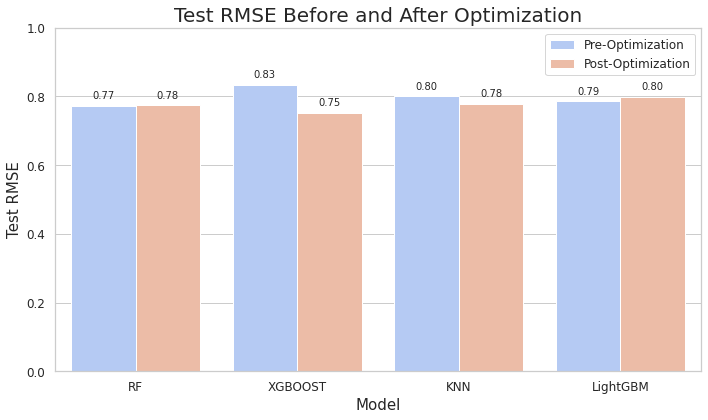

In [71]:
# 创建RMSE图形
plt.figure(figsize=(10,6))
rmse_plot = sns.barplot(x='Model', y='Value', hue='Optimization', data=data[data['Metric']=='Test RMSE'], palette="coolwarm")
plt.title('Test RMSE Before and After Optimization', fontsize=20)
plt.xlabel('Model', fontsize=15)
plt.ylabel('Test RMSE', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1)  # 设置y轴范围
plt.legend(fontsize=12)
plt.tight_layout()

# 在每个bar上显示数值
for p in rmse_plot.patches:
    rmse_plot.annotate(format(p.get_height(), '.2f'), 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', 
                       xytext = (0, 10), 
                       textcoords = 'offset points',
                       fontsize = 10)
plt.show()

In [21]:
with open("ensemble_model.pkl", "wb") as file:
    pickle.dump(ensemble_model, file)

In [57]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# 定义基础模型
base_learners = [
    ('rf', RandomForestRegressor()),
    ('xgb', XGBRegressor(tree_method='gpu_hist', 
                         subsample=1, 
                         n_estimators=500, 
                         min_child_weight=5, 
                         max_depth=10, 
                         learning_rate=0.01, 
                         reg_lambda=0.1, 
                         colsample_bytree=0.5, 
                         reg_alpha=0)),
    ('knn', KNeighborsRegressor(metric='manhattan', 
                                n_neighbors=5, 
                                weights='distance')),
    ('lgbm', LGBMRegressor())
]

# 定义元模型
meta_learner = LinearRegression()

# 定义堆叠模型
stacking_model = StackingRegressor(estimators=base_learners, 
                                   final_estimator=meta_learner)

# 拟合数据
stacking_model.fit(X_train, y_train)

# 预测
LR_stacking_train_predictions = stacking_model.predict(X_train)
stacking_predictions = stacking_model.predict(X_test)



# Calculate and print R^2 score
stacking_train_r2 = r2_score(y_train, LR_stacking_train_predictions)
stacking_test_r2 = r2_score(y_test, stacking_predictions)
print("Train R^2 score: ", stacking_train_r2)
print("Test R^2 score: ", stacking_test_r2)

# Calculate and print RMSE
stacking_rmse_train = np.sqrt(mean_squared_error(y_train, LR_stacking_train_predictions))
stacking_rmse_test = np.sqrt(mean_squared_error(y_test, stacking_predictions))
print(f"Train RMSE: {stacking_rmse_train}")
print(f"Test RMSE: {stacking_rmse_test}")


Train R^2 score:  0.9925353217212819
Test R^2 score:  0.7298812208540354
Train RMSE: 0.12887894804837133
Test RMSE: 0.7324441786438903


In [58]:
with open("LR_stacking_model.pkl", "wb") as file:
    pickle.dump(stacking_model, file)

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

# 使用 seaborn 默认的主题
sns.set_theme()

# 创建一个新的图表，设置分辨率为 300 dpi
fig = plt.figure(figsize=(10, 10), dpi=1200)

# 创建网格
gs = GridSpec(4,4)

# 创建子图
ax_joint = fig.add_subplot(gs[1:4,0:3])
ax_marg_x = fig.add_subplot(gs[0,0:3])
ax_marg_y = fig.add_subplot(gs[1:4,3])

# 绘制散点图和直方图
ax_joint.scatter(y_train, LR_stacking_train_predictions, color='blue', s=20, alpha=0.5, label='Train')
ax_joint.scatter(y_test, stacking_predictions, color='red', s=20, alpha=0.5, label='Test')

# 添加直方图和 KDE 曲线
sns.distplot(y_train, color='blue', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2, "label": "KDE"})
sns.distplot(y_test, color='red', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

sns.distplot(LR_stacking_train_predictions, color='blue', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2})
sns.distplot(stacking_predictions, color='red', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

# 去掉直方图的背景和坐标
ax_marg_x.axis('off')
ax_marg_y.axis('off')

# 添加一条对角线，代表完美预测
ax_joint.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         color='gray', linestyle='--')

# 增加网格线
ax_joint.grid(True, linestyle='--', alpha=0.6)

# 添加图例
ax_joint.legend()

# 添加轴标签
ax_joint.set_xlabel('True Values', fontsize=14)
ax_joint.set_ylabel('Predictions', fontsize=14)

# 设置标题
#ax_joint.set_title('Stacking Model Predictions vs True Values', fontsize=16)

# 设置边界和间距
plt.tight_layout()

# 显示图表
plt.show()


/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packa

In [30]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.neural_network import MLPRegressor

# 定义元模型
meta_learners = [LinearRegression(), 
                 RandomForestRegressor(), 
                 SVR(), 
                 MLPRegressor()]

# 分别训练四种元模型并打印结果
for meta_learner in meta_learners:
    stacking_model = StackingRegressor(estimators=base_learners, final_estimator=meta_learner)
    stacking_model.fit(X_train, y_train)
    stacking_predictions = stacking_model.predict(X_test)
    # 计算并打印评价指标
    # Calculate and print R^2 score
    #stacking_train_r2 = r2_score(y_train, stacking_train_predictions)
    stacking_test_r2 = r2_score(y_test, stacking_predictions)
    print("Train R^2 score: ", stacking_train_r2)
    print("Test R^2 score: ", stacking_test_r2)

    # Calculate and print RMSE
    #stacking_rmse_train = np.sqrt(mean_squared_error(y_train, stacking_train_predictions))
    stacking_rmse_test = np.sqrt(mean_squared_error(y_test, stacking_predictions))
    print(f"Train RMSE: {stacking_rmse_train}")
    print(f"Test RMSE: {stacking_rmse_test}")

Train R^2 score:  0.9927500775817016
Test R^2 score:  0.7220682951087589
Train RMSE: 0.12701152039750319
Test RMSE: 0.7429612929029494
Train R^2 score:  0.9927500775817016
Test R^2 score:  0.6966207676425744
Train RMSE: 0.12701152039750319
Test RMSE: 0.7762293621375518
Train R^2 score:  0.9927500775817016
Test R^2 score:  0.7213676631749968
Train RMSE: 0.12701152039750319
Test RMSE: 0.7438971608789019
Train R^2 score:  0.9927500775817016
Test R^2 score:  0.7193680340563929
Train RMSE: 0.12701152039750319
Test RMSE: 0.7465617100633624


In [66]:
###LightGBM
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# 定义基础模型
base_learners = [
    ('rf', RandomForestRegressor()),
    ('xgb', XGBRegressor(tree_method='gpu_hist', 
                         subsample=1, 
                         n_estimators=500, 
                         min_child_weight=5, 
                         max_depth=10, 
                         learning_rate=0.01, 
                         reg_lambda=0.1, 
                         colsample_bytree=0.5, 
                         reg_alpha=0)),
    ('knn', KNeighborsRegressor(metric='manhattan', 
                                n_neighbors=5, 
                                weights='distance')),
    ('lgbm', LGBMRegressor())
]

# 定义元模型
meta_learner = LGBMRegressor()

# 定义堆叠模型
stacking_model = StackingRegressor(estimators=base_learners, 
                                   final_estimator=meta_learner)


# 拟合数据
stacking_model.fit(X_train, y_train)

# 预测
stacking_train_predictions = stacking_model.predict(X_train)
stacking_predictions = stacking_model.predict(X_test)



# Calculate and print R^2 score
stacking_train_r2 = r2_score(y_train, stacking_train_predictions)
stacking_test_r2 = r2_score(y_test, stacking_predictions)
print("Train R^2 score: ", stacking_train_r2)
print("Test R^2 score: ", stacking_test_r2)

# Calculate and print RMSE
stacking_rmse_train = np.sqrt(mean_squared_error(y_train, stacking_train_predictions))
stacking_rmse_test = np.sqrt(mean_squared_error(y_test, stacking_predictions))
print(f"Train RMSE: {stacking_rmse_train}")
print(f"Test RMSE: {stacking_rmse_test}")


Train R^2 score:  0.9476636255400851
Test R^2 score:  0.6948447647211053
Train RMSE: 0.34125439414745157
Test RMSE: 0.7784980967249904


In [67]:
with open("LG_stacking_model.pkl", "wb") as file:
    pickle.dump(stacking_model, file)

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

# 使用 seaborn 默认的主题
sns.set_theme()

# 创建一个新的图表，设置分辨率为 300 dpi
fig = plt.figure(figsize=(10, 10), dpi=1200)

# 创建网格
gs = GridSpec(4,4)

# 创建子图
ax_joint = fig.add_subplot(gs[1:4,0:3])
ax_marg_x = fig.add_subplot(gs[0,0:3])
ax_marg_y = fig.add_subplot(gs[1:4,3])

# 绘制散点图和直方图
ax_joint.scatter(y_train, stacking_train_predictions, color='blue', s=20, alpha=0.5, label='Train')
ax_joint.scatter(y_test, stacking_predictions, color='red', s=20, alpha=0.5, label='Test')

# 添加直方图和 KDE 曲线
sns.distplot(y_train, color='blue', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2, "label": "KDE"})
sns.distplot(y_test, color='red', ax=ax_marg_x, bins=25, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

sns.distplot(stacking_train_predictions, color='blue', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "deepskyblue"}, kde_kws={"color": "blue", "lw": 2})
sns.distplot(stacking_predictions, color='red', ax=ax_marg_y, bins=25, vertical=True, hist_kws={"alpha": 0.6, "color": "salmon"}, kde_kws={"color": "red", "lw": 2})

# 去掉直方图的背景和坐标
ax_marg_x.axis('off')
ax_marg_y.axis('off')

# 添加一条对角线，代表完美预测
ax_joint.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         color='gray', linestyle='--')

# 增加网格线
ax_joint.grid(True, linestyle='--', alpha=0.6)

# 添加图例
ax_joint.legend()

# 添加轴标签
ax_joint.set_xlabel('True Values', fontsize=14)
ax_joint.set_ylabel('Predictions', fontsize=14)

# 设置标题
#ax_joint.set_title('Stacking Model Predictions vs True Values', fontsize=16)

# 设置边界和间距
plt.tight_layout()

# 显示图表
plt.show()


/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/home/szy/anaconda3/envs/qsar_gpu/lib/python3.7/site-packa